### Visual representation of event records

Let us first import some particle physics specific packages. HepMC is the standardised output format for event generators. The package 
'pyhepmc' provides an interface in python. The 'particle' package provides a useful container representing information on a single particle.

In [2]:
import pyhepmc
from particle import Particle

We also need 'matplotlib' to create figures where we can draw the events. It works well with the 'numpy' package.

In [3]:
import numpy as np
import math as m
import matplotlib.pyplot as plt
import matplotlib.patches as patches

Let us define some useful functions, one to retreive the name of a particle, and one to strip a HepMC event of everything but the 
(interesting) final state particles.

In [4]:
def GetName(particle):
    """Retreive the name of the particle.

    Particle types from Monte Carlo generators are identified
    by a numbering scheme, for example 1,2,3,4,5,6 are the six
    quarks, 21 is a gluon and 23 is the Z boson.
    Here we use the additional 'particle' package to convert 
    these numbers into more useful strings.
    """
    return Particle.from_pdgid(particle.pid).name


def GetCharge(particle):
    return Particle.from_pdgid(particle.pid).charge


def GetFS(event):
    """Obtain all final state particles from an event.

    The event record will contain all kinds of intermediate particles.
    We are only interested in the ones that are actually produced in the
    end. We can identify them by their status code.
    """
    return [p for p in event.particles if p.status == 1]

We can always see the comments we made at the beginning with the useful 'help' function!

In [5]:
help(GetFS)

Help on function GetFS in module __main__:

GetFS(event)
    Obtain all final state particles from an event.
    
    The event record will contain all kinds of intermediate particles.
    We are only interested in the ones that are actually produced in the
    end. We can identify them by their status code.



No let us open the hepmc file and look whats inside...

In [7]:
# data for hard process
with pyhepmc.open('data/events.hepmc.gz') as f:
    for i,event in enumerate(f):
        print(f'Looking at event {i}:')
        fs = GetFS(event)
        for p in fs:
            print(f'\t particle = {GetName(p)}')
            print(f'\t px = {p.momentum.px} GeV py = {p.momentum.py} GeV')
            print(f'\t pt = {p.momentum.pt()} GeV')
            print(f'\t pz = {p.momentum.pz} GeV')
            print(f'\t eta = {p.momentum.eta()} GeV')
            print(f'\t phi = {p.momentum.phi()} GeV')

Looking at event 0:
	 particle = Z0
	 px = 298.6266212222 GeV py = 178.2607196243 GeV
	 pt = 347.7854842622973 GeV
	 pz = -171.6249006297 GeV
	 eta = -0.4753718462914376 GeV
	 phi = 0.5381628686173399 GeV
	 particle = s
	 px = -219.4500311752 GeV py = -90.78850038335 GeV
	 pt = 237.48866917108654 GeV
	 pz = 45.52963996235 GeV
	 eta = 0.19055753812391799 GeV
	 phi = -2.7493241350615043 GeV
	 particle = s~
	 px = -79.17659004698 GeV py = -87.47221924097 GeV
	 pt = 117.98441231962744 GeV
	 pz = -29.8219627243 GeV
	 eta = -0.25014501249586385 GeV
	 phi = -2.3064564373329435 GeV
Looking at event 1:
	 particle = Z0
	 px = -80.03400550187 GeV py = 21.75697004483 GeV
	 pt = 82.93857837101494 GeV
	 pz = 43.50746507207 GeV
	 eta = 0.5030832331490722 GeV
	 phi = 2.876160516628745 GeV
	 particle = g
	 px = 82.20642396784 GeV py = 50.34195781639 GeV
	 pt = 96.39610395844558 GeV
	 pz = -118.0669737415 GeV
	 eta = -1.0317601292266179 GeV
	 phi = 0.5494761777984047 GeV
	 particle = d~
	 px = -2.172418

In [45]:
# data for z decay
with pyhepmc.open('data/events_decayed.hepmc.gz') as f:
    for i,event in enumerate(f):
        print(f'Looking at event {i}:')
        fs = GetFS(event)
        for p in fs:
            print(f'\t particle = {GetName(p)}')
            print(f'\t px = {p.momentum.px} GeV py = {p.momentum.py} GeV')
            print(f'\t pt = {p.momentum.pt()} GeV')
            print(f'\t pz = {p.momentum.pz} GeV')
            print(f'\t eta = {p.momentum.eta()} GeV')
            print(f'\t phi = {p.momentum.phi()} GeV')

Looking at event 0:
	 particle = (ud)(0)
	 px = -0.1661418877189 GeV py = -1.253470721851 GeV
	 pt = 1.2644334610379726 GeV
	 pz = 5337.612673599 GeV
	 eta = 9.041056798110898 GeV
	 phi = -1.7025736948718722 GeV
	 particle = s
	 px = -0.05356731933242 GeV py = -0.1930022682287 GeV
	 pt = 0.20029811092939576 GeV
	 pz = 2.025389011547 GeV
	 eta = 3.009293504630089 GeV
	 phi = -1.8415294894420864 GeV
	 particle = u
	 px = 0.2052984448585 GeV py = 0.1250851412834 GeV
	 pt = 0.24040329455148218 GeV
	 pz = 37.94171632575 GeV
	 eta = 5.754645790351971 GeV
	 phi = 0.5472183167408712 GeV
	 particle = (ud)(0)
	 px = 1.468936617741 GeV py = -0.3558492087371 GeV
	 pt = 1.5114243104764422 GeV
	 pz = -5472.427212688 GeV
	 eta = -8.88757226933501 GeV
	 phi = -0.23767090850469486 GeV
	 particle = u
	 px = -0.2300585741512 GeV py = 0.3254768385761 GeV
	 pt = 0.3985751121055802 GeV
	 pz = -966.2341429287 GeV
	 eta = -8.486412723376265 GeV
	 phi = 2.186095138170043 GeV
	 particle = mu-
	 px = 15.76747392

In [46]:
# data for hadronised
with pyhepmc.open('data/events_decayed_hadronised.hepmc.gz') as f:
    for i,event in enumerate(f):
        print(f'Looking at event {i}:')
        fs = GetFS(event)
        for p in fs:
            print(f'\t particle = {GetName(p)}')
            print(f'\t px = {p.momentum.px} GeV py = {p.momentum.py} GeV')
            print(f'\t pt = {p.momentum.pt()} GeV')
            print(f'\t pz = {p.momentum.pz} GeV')
            print(f'\t eta = {p.momentum.eta()} GeV')
            print(f'\t phi = {p.momentum.phi()} GeV')

Looking at event 0:
	 particle = mu-
	 px = 11.01748042464 GeV py = 15.56006032645 GeV
	 pt = 19.065685203267385 GeV
	 pz = 345.8439518407 GeV
	 eta = 3.5920036242595845 GeV
	 phi = 0.9546803923732181 GeV
	 particle = mu+
	 px = 10.56153105338 GeV py = -77.69597882278 GeV
	 pt = 78.41052903418895 GeV
	 pz = 221.104417781 GeV
	 eta = 1.7598778253398732 GeV
	 phi = -1.4356903559936278 GeV
	 particle = pi-
	 px = -0.4779601449584 GeV py = -0.1674792263975 GeV
	 pt = 0.5064535432232258 GeV
	 pz = -0.02355627953018 GeV
	 eta = -0.04649546744424586 GeV
	 phi = -2.804557820003817 GeV
	 particle = pi+
	 px = 0.2012969709325 GeV py = -0.8120230685699 GeV
	 pt = 0.8366014190737883 GeV
	 pz = 71.29811787967 GeV
	 eta = 5.138459053200471 GeV
	 phi = -1.3277992248684898 GeV
	 particle = K+
	 px = -22.73805590277 GeV py = 20.34314014369 GeV
	 pt = 30.51003994004769 GeV
	 pz = 20.34382559129 GeV
	 eta = 0.6252487172058837 GeV
	 phi = 2.4117280759688695 GeV
	 particle = Xi0
	 px = -0.4787533813456 GeV

In [84]:
#main code
def get_figure(particles):
    pxs=1.5*max([abs(p.momentum.px) for p in particles]) 
    pys=1.5*max([abs(p.momentum.py) for p in particles])
    radius_x_max=max([abs(p.momentum.px) for p in particles]) #takes maximum x value of each event
    radius_y_max=max([abs(p.momentum.py) for p in particles]) #takes maximum y value of each event   
    pxymax=max(pxs,pys)
    fig, ax = plt.subplots(figsize=(6,6))
    ax.axis('equal')
    ax.axis([-pxymax, pxymax, -pxymax, pxymax])
    ax.axhline(y=0, xmin=-pxs, xmax=pxs, color='black',alpha=0.1, linewidth=0.5)
    ax.axvline(x=0, ymin=-pys, ymax=pys, color='black', alpha=0.1, linewidth=0.5)
    ax.set_xlabel('$p_{x}$ (GeV)')
    ax.set_ylabel('$p_{y}$ (GeV)')
    return fig,ax  

def line_args(particle):
    args={}
    if abs(particle.pid) in [21,23,24,25]: 
        args["linestyle"]=':' # all bosons represented with dotted lines
        if particle.pid == 21: 
            args["color"]='blue' # g
        if particle.pid == 23: 
            args["color"]='red' # Z  
        if abs(particle.pid) == 24: 
            args["color"]='green' # W  
        if particle.pid == 25: args["color"]='orange' # H 
    elif abs(particle.pid) in [11,13,15]: 
        args["linestyle"]='--' # all leptons (excluding the neutrinos) are represented with dashed lines
        if abs(particle.pid) == 11: args["color"]='red' # electron 
        if abs(particle.pid) == 13: args["color"]='blue' # muon 
        if abs(particle.pid) == 15: args["color"]='green' # tau 
    elif abs(particle.pid) in [12,14,16]:
        args["linestyle"]='None' # all neutrino leptons are not represented because they are invisible
    elif abs(particle.pid) in [1,2,3,4,5]: 
        args["linestyle"]='solid' # all quarks represented with solid lines
        if abs(particle.pid) == 1:
            args["color"]='red' # d
        if abs(particle.pid) == 2:
            args["color"]='green' # u
        if abs(particle.pid) == 3:
            args["color"]='orange' # s
        if abs(particle.pid) == 4:
            args["color"]='blue' # c
        if abs(particle.pid) == 5:
            args["color"]='purple' # b   
        if abs(particle.pid) == 6:
            args["color"] = 'brown' # t
    else:
        args["color"] = 'black' # if the particle is not any of the particles mentioned above, it will be represented with black line
        args["linestyle"] = ':'

    if GetCharge(particle) > 0:
        args["marker"] = '^'
    elif GetCharge(particle) < 0:
            args["marker"] = 'v'
    elif GetCharge(particle) == 0:
            args["marker"] = 'o'
    return args        

def line_label(particle): # this function labels all the types of particles so they can be shown in a table later
    argss={}
    if abs(particle.pid) == 21: 
        argss["label"]='g'
    elif abs(particle.pid) == 23:
        argss["label"]='Z'
    elif abs(particle.pid) == 24:
        argss["label"]='W+-'
    elif abs(particle.pid) == 25:
        argss["label"]='H'
    elif abs(particle.pid) == 1: 
        argss["label"]='d'
    elif abs(particle.pid) == 2: 
        argss["label"]='u'
    elif abs(particle.pid) == 3:
        argss["label"]='s'
    elif abs(particle.pid) == 4:
        argss["label"]='c'
    elif abs(particle.pid) == 5: 
        argss["label"]='b'
    elif abs(particle.pid) == 6:
        argss["label"]='t'
    elif abs(particle.pid) == 11:
        argss["label"]='e'
    elif abs(particle.pid) == 12:
        argss["label"]='ve'
    elif abs(particle.pid) == 13:
        argss["label"]='μ'
    elif abs(particle.pid) == 14:
        argss["label"]='vμ'
    elif abs(particle.pid) == 15:
        argss["label"]='τ'
    elif abs(particle.pid) == 16:
        argss["label"]='vτ'
    else:
        argss['label']=GetName(particle)
    return argss

def draw_transverse(ax, particles, showlegend=True):
    for p in particles:
        ax.plot([0,p.momentum.px], [0,p.momentum.py], **line_args(p), **line_label(p), markersize=5) #marker='s', markersize=2#
       # ax.plot([0], [0], marker= 'o', color = 'white', markersize=6)
        circle_max = patches.Circle((0, 0), radius=p.momentum.pt(), fill = False, alpha=0.5)
        ax.add_patch(circle_max)
        plt.legend(bbox_to_anchor=(1.02,1), loc='upper left', borderaxespad=0)
        if showlegend: ax.legend()# prints the key of labels from earlier into each graph

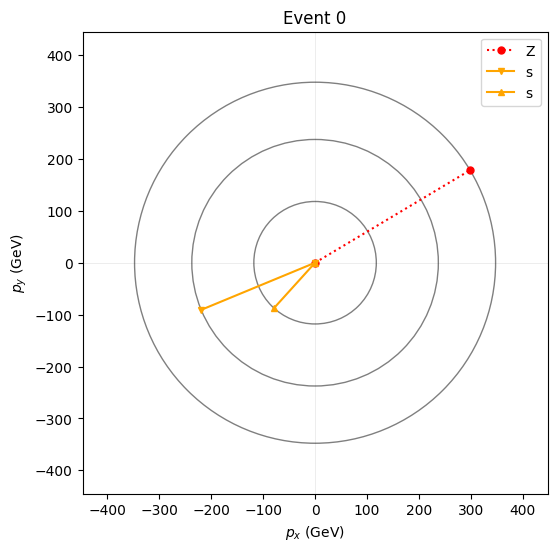

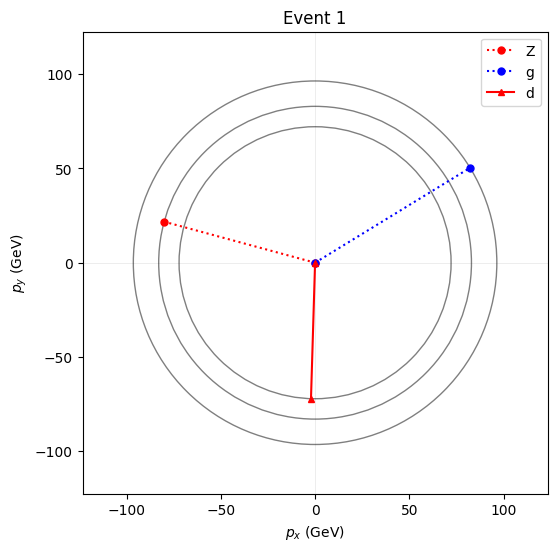

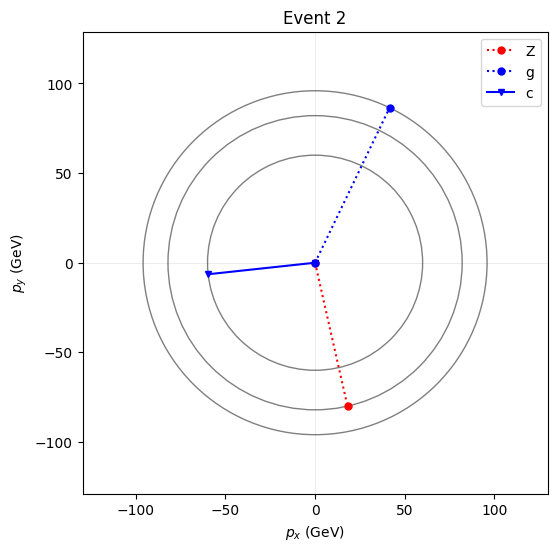

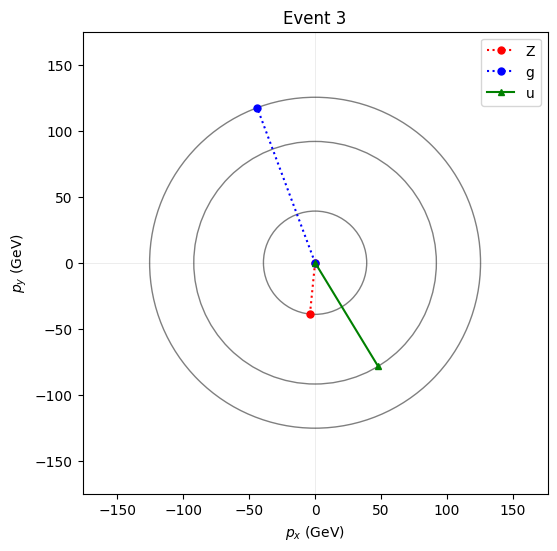

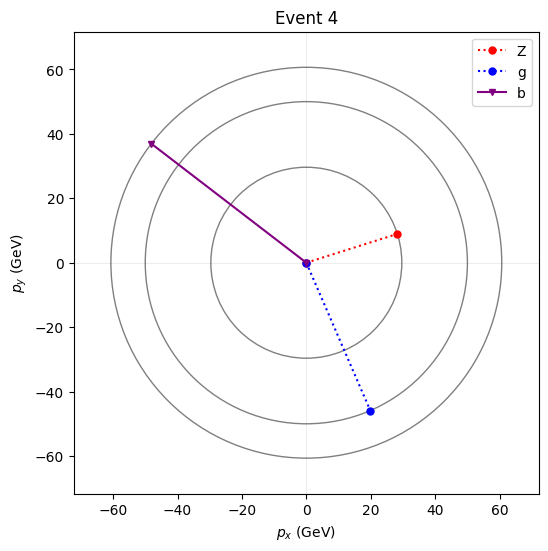

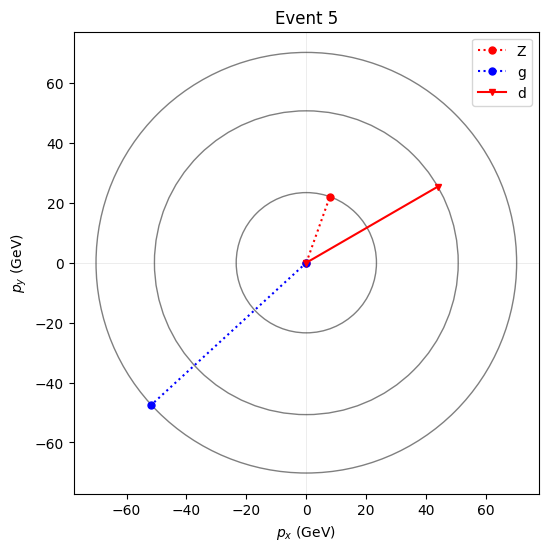

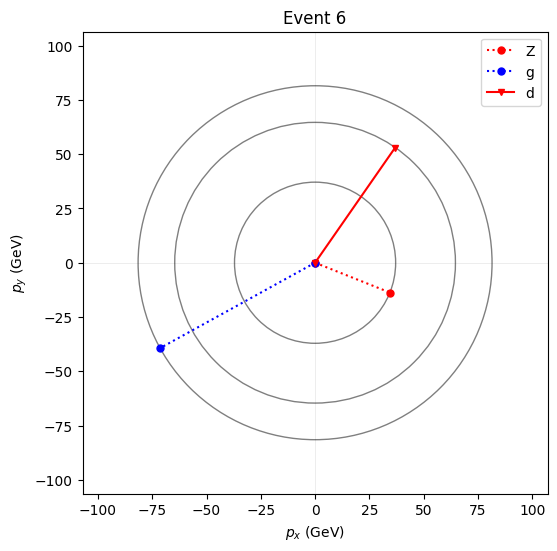

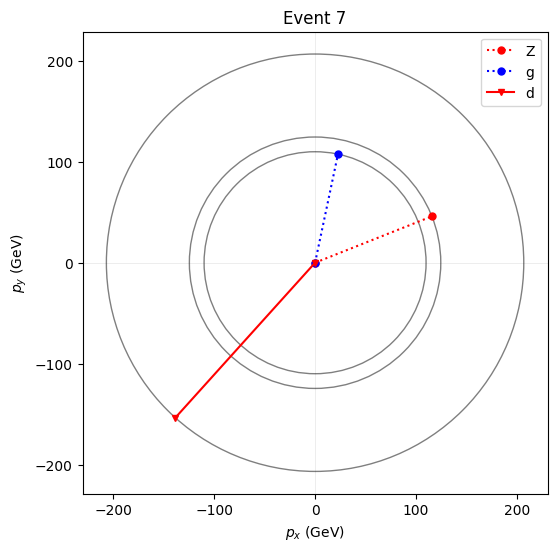

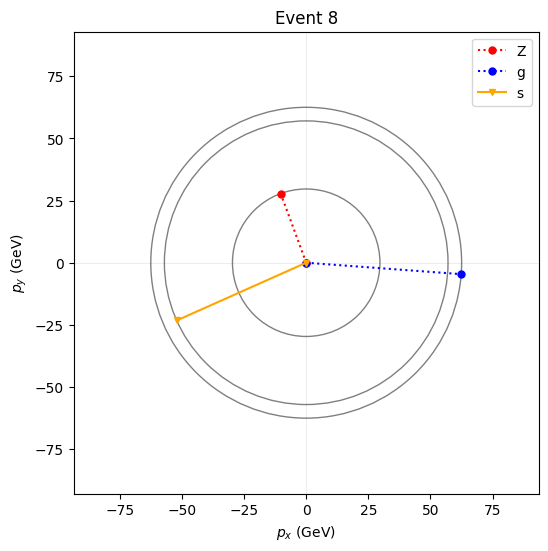

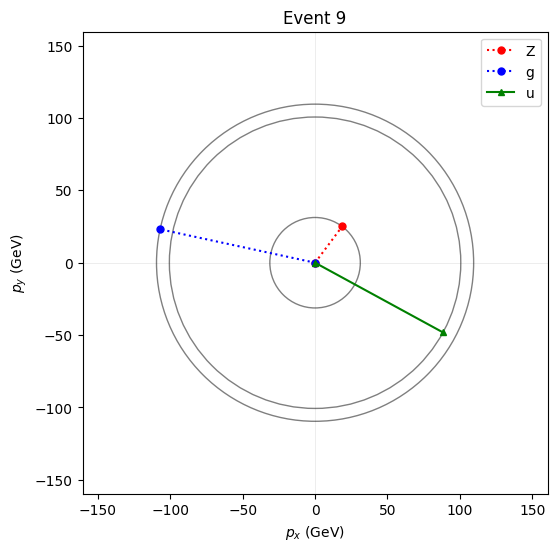

In [86]:
# plot hard, transverse
with pyhepmc.open('data/events.hepmc.gz') as f:
    for i,event in enumerate(f):
        fs = GetFS(event)
        fig,ax=get_figure(fs)
        draw_transverse(ax, fs)
        ax.set_title(f'Event {i}')
        plt.show()  

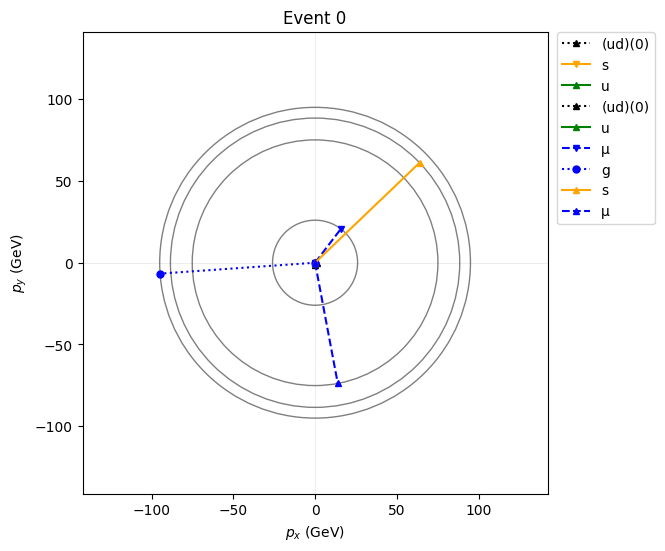

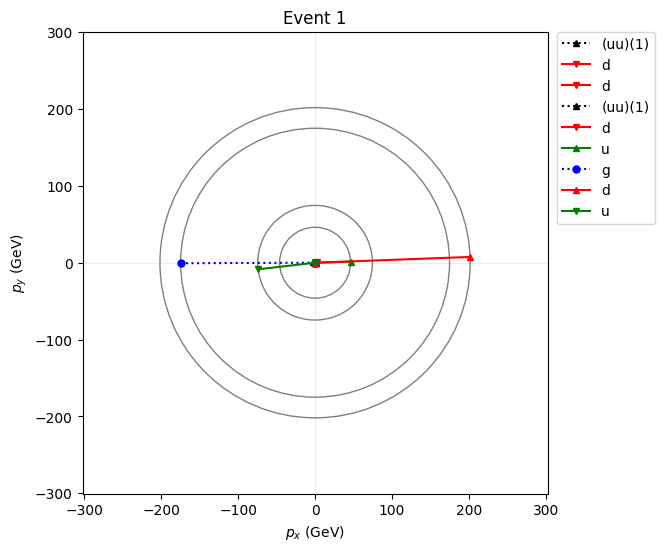

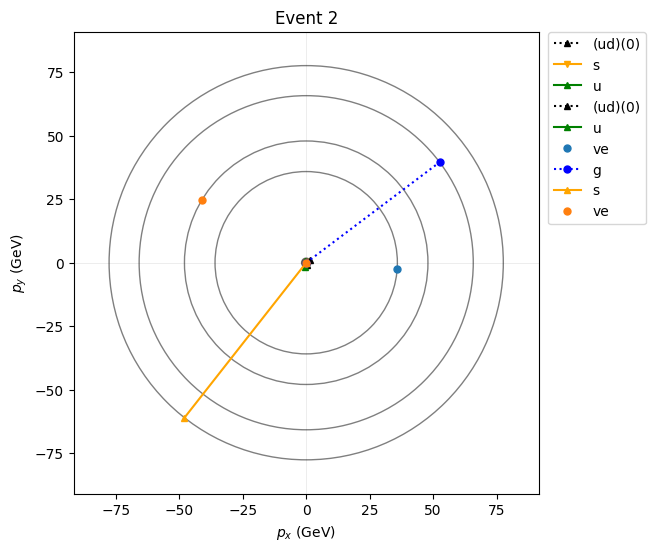

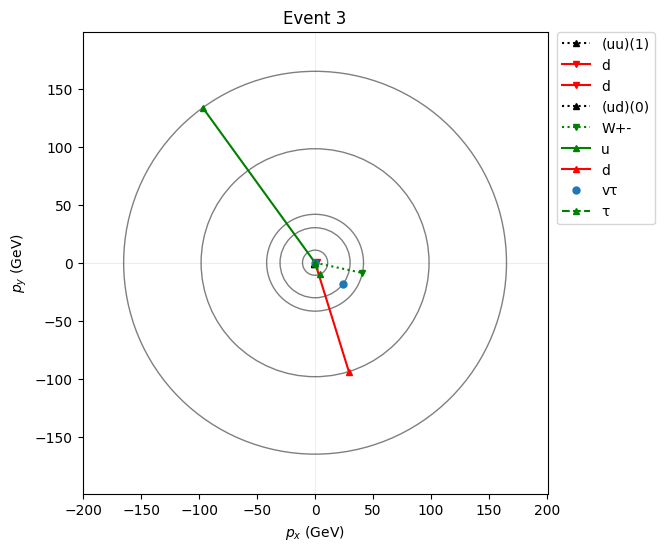

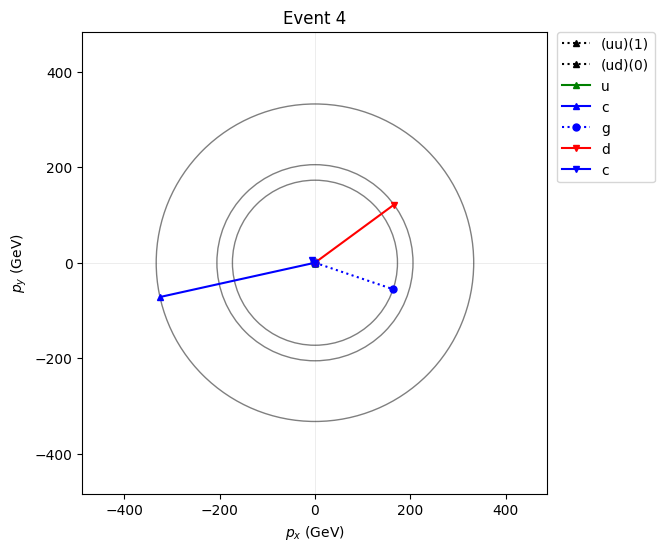

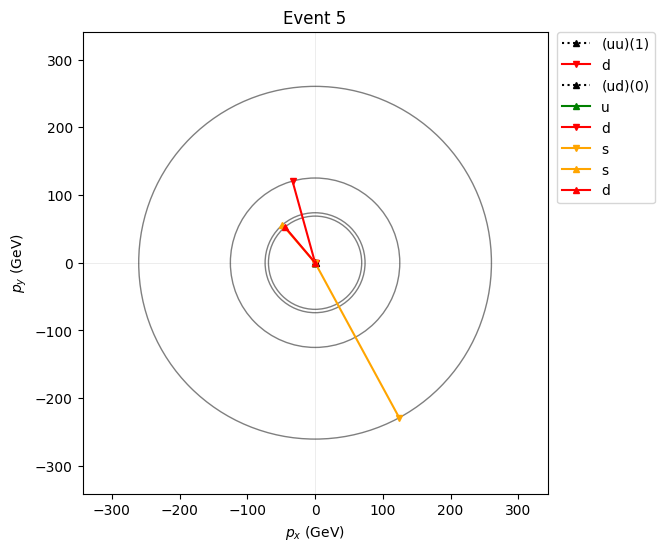

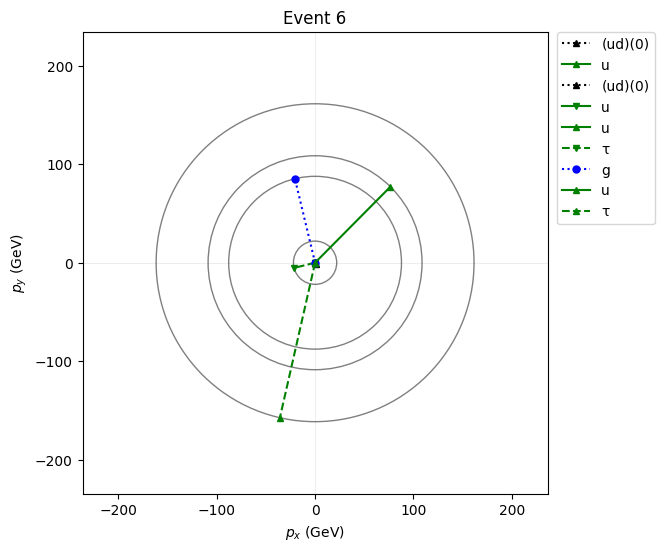

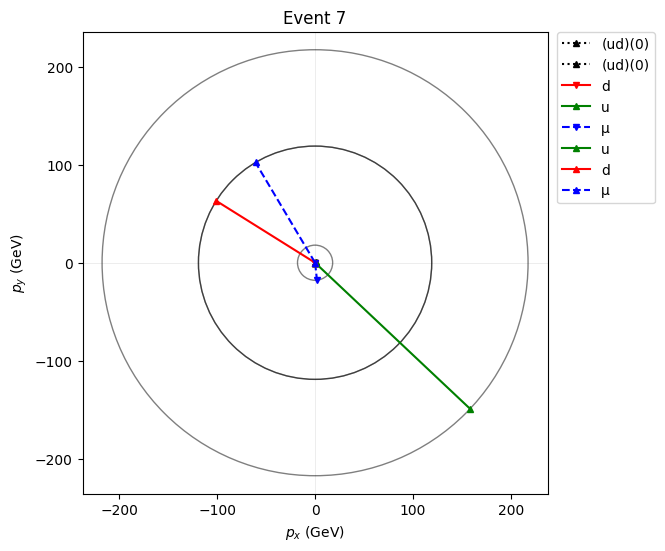

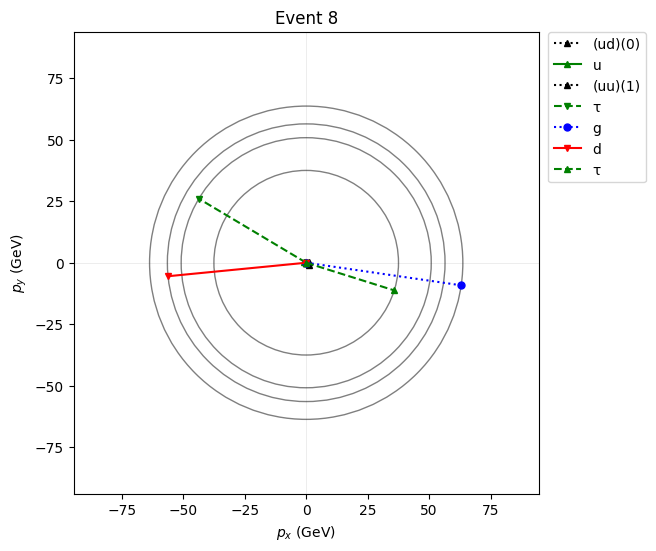

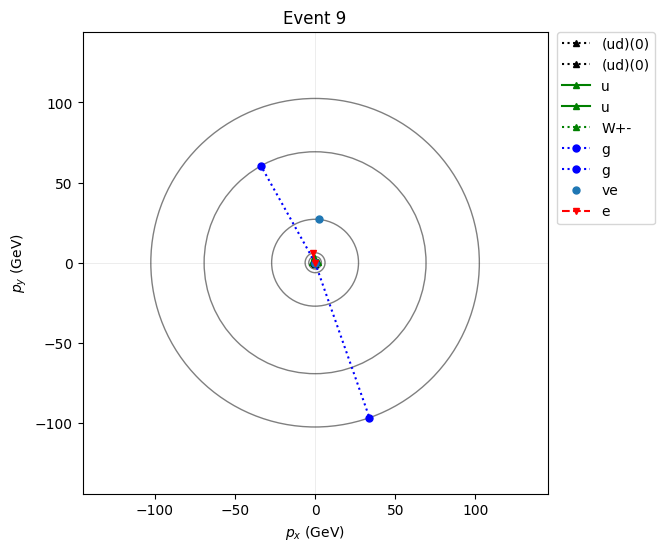

In [93]:
# plot transverse, decayed
with pyhepmc.open('data/events_decayed.hepmc.gz') as f:
    for i,event in enumerate(f):
        fs = GetFS(event)
        fig,ax=get_figure(fs)
        draw_transverse(ax, fs, showlegend=False)
        ax.set_title(f'Event {i}')
        plt.show()

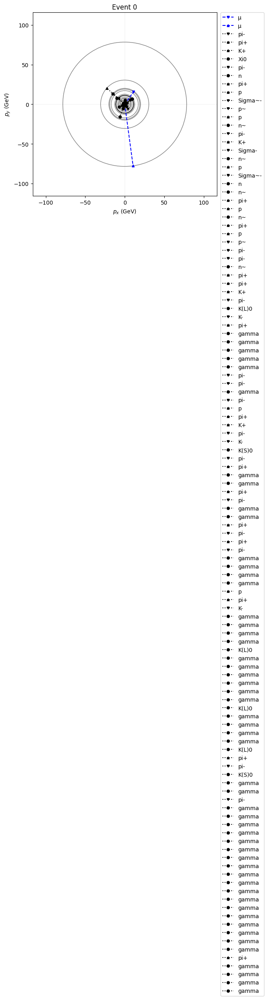

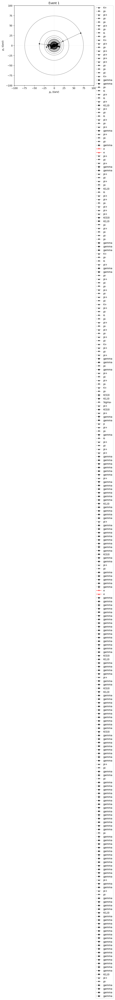

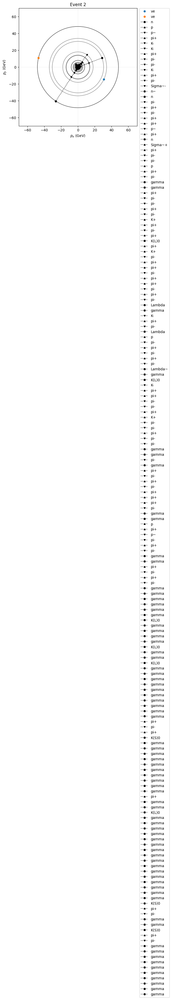

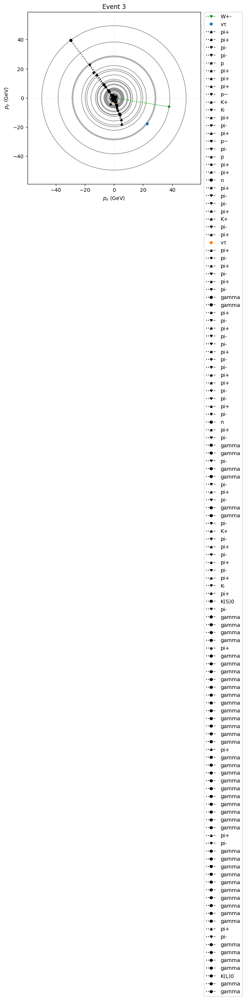

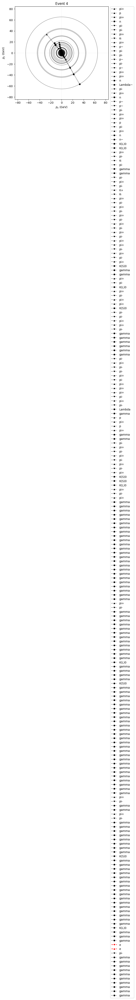

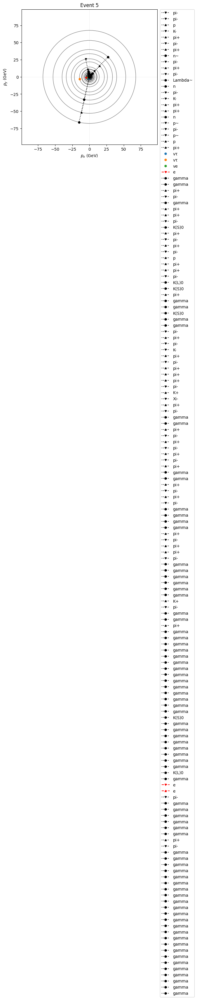

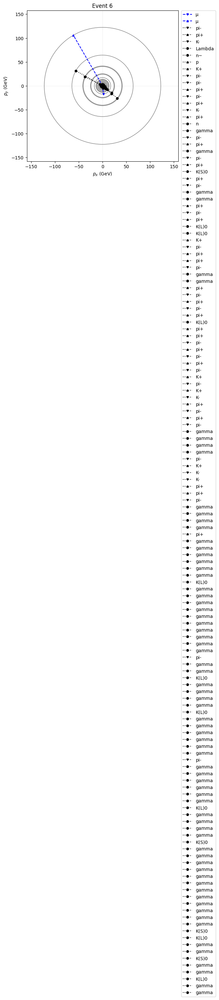

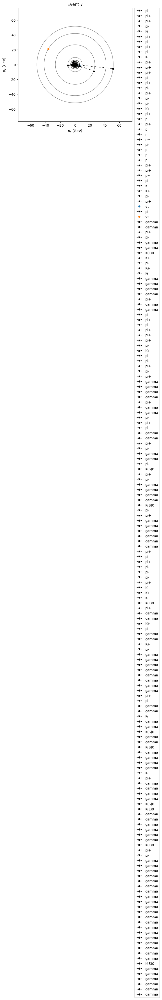

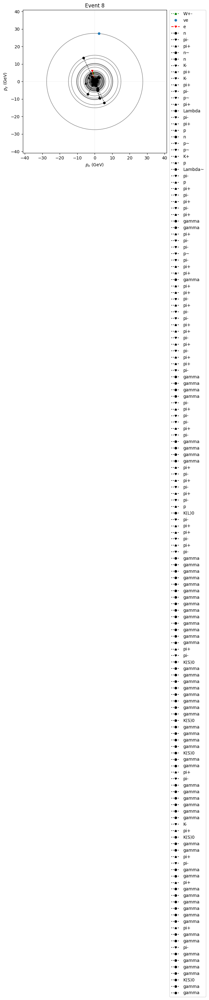

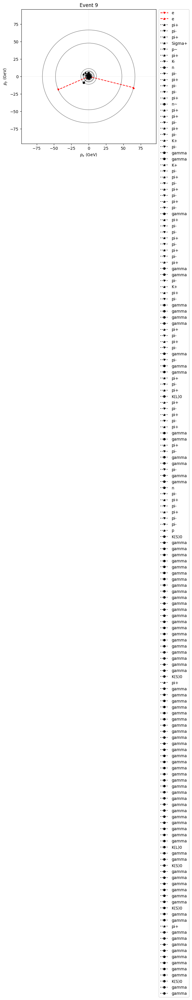

In [73]:
#plot tranasverse, hadronised
with pyhepmc.open('data/events_decayed_hadronised.hepmc.gz') as f:
    for i,event in enumerate(f):
        fs = GetFS(event)
        fig,ax=get_figure(fs)
        draw_transverse(ax, fs, showlegend=False)
        ax.set_title(f'Event {i}')
        plt.show()

In [91]:
# main etaphi
def get_figure_etaphi(particles):
    phix=1.1*max([abs(p.momentum.phi()) for p in particles])
    etay=1.1*max([abs(p.momentum.eta()) for p in particles])
    fig,ax = plt.subplots(figsize=(6,6))
    ax.axis([-m.pi, m.pi, -5, 5])
    ax.axhline(y=0, xmin=-m.pi, xmax=m.pi, color='black', alpha=0.1, linewidth=0.5)
    ax.axvline(x=0, ymin=-5, ymax=5, color='black', alpha=0.1, linewidth=0.5)
    ax.set_xlabel('$\phi$')
    ax.set_ylabel('$\eta$')
    return fig,ax

def draw_etaphi(ax, particles, showlegend=True):
    for p in particles:
        lineargs=line_args(p)
        ax.plot([p.momentum.phi()], [p.momentum.eta()], **lineargs, **line_label(p))
        circle_max = patches.Circle((p.momentum.phi(), p.momentum.eta()), radius=0.005*p.momentum.pt(), fill = True, alpha=0.5, 
                                    color=lineargs.get("color", "pink"))
        ax.add_patch(circle_max)
        plt.legend(bbox_to_anchor=(1.02,1), loc='upper left', borderaxespad=0) 
        if showlegend: ax.legend() # prints the key of labels from earlier into each graph

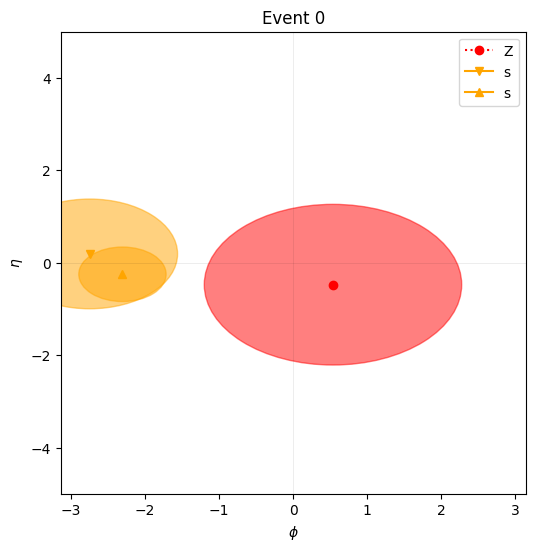

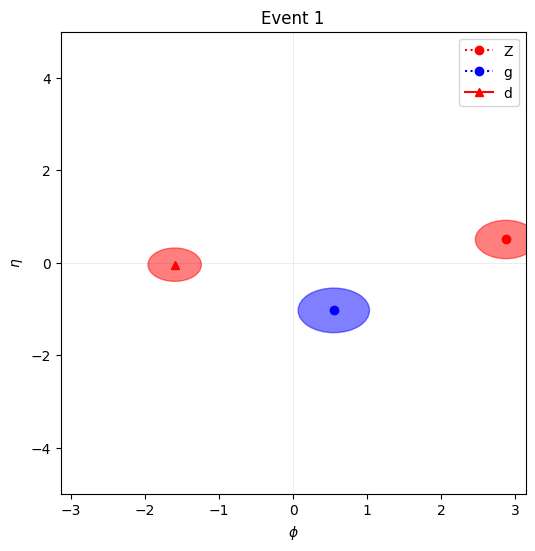

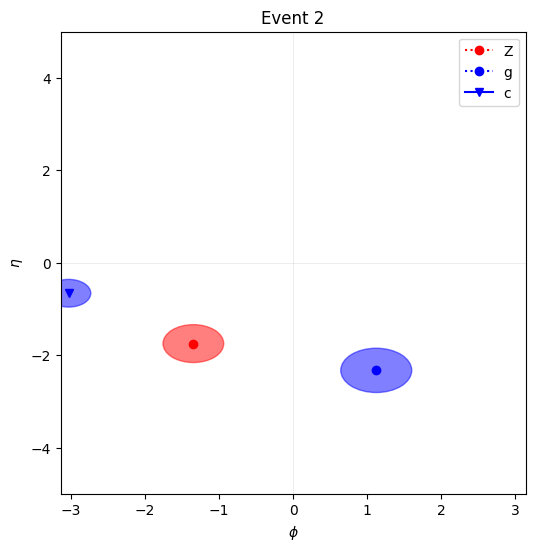

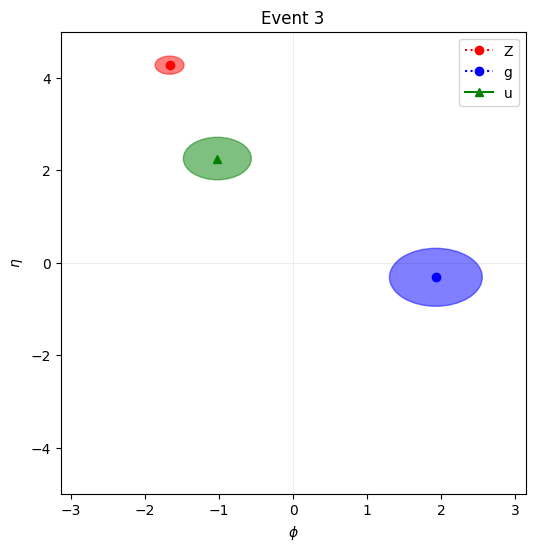

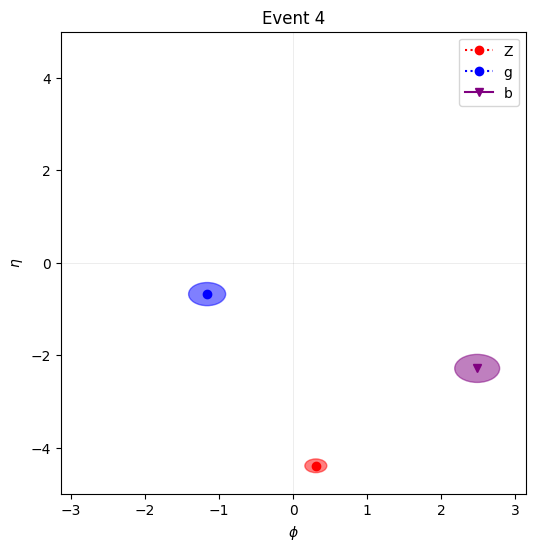

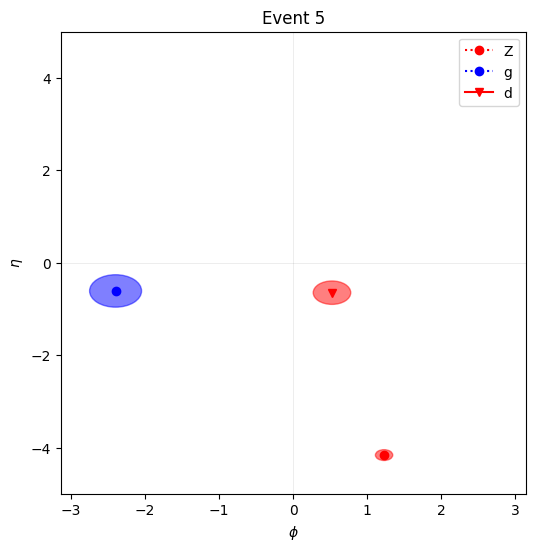

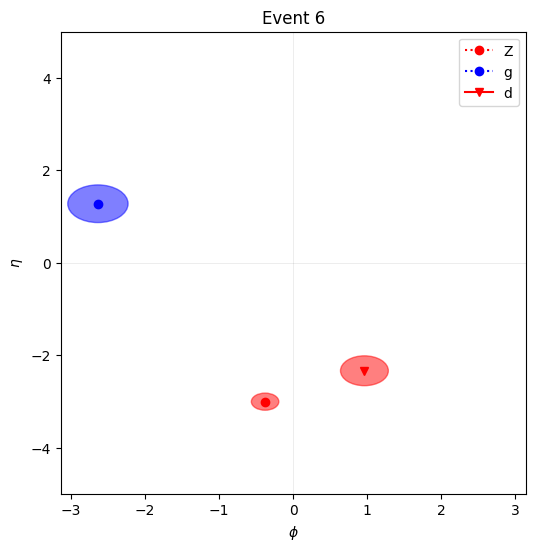

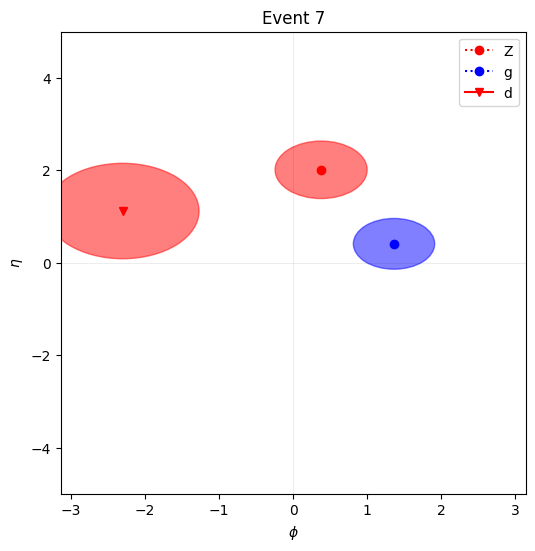

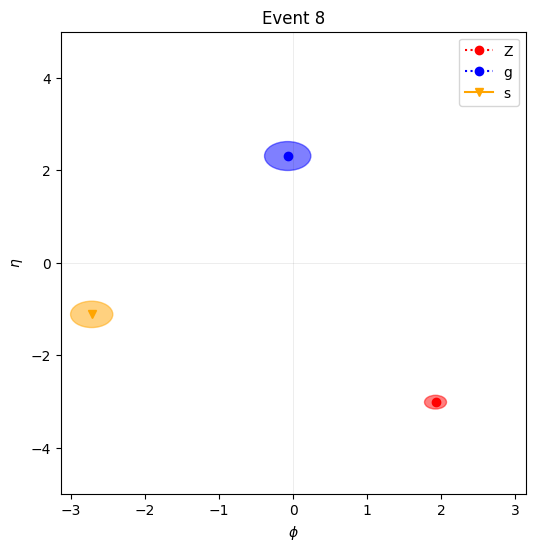

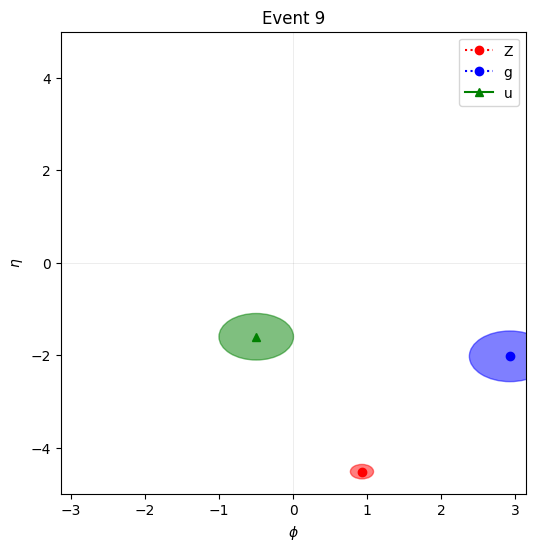

In [92]:
# plot etaphi, hard
with pyhepmc.open('data/events.hepmc.gz') as f:
    for i,event in enumerate(f):
        fs = GetFS(event)
        fig,ax=get_figure_etaphi(fs)
        draw_etaphi(ax, fs)
        ax.set_title(f'Event {i}')
        plt.show()

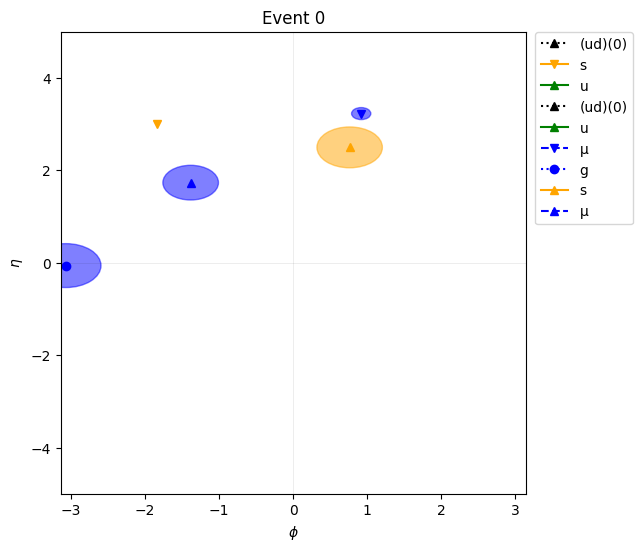

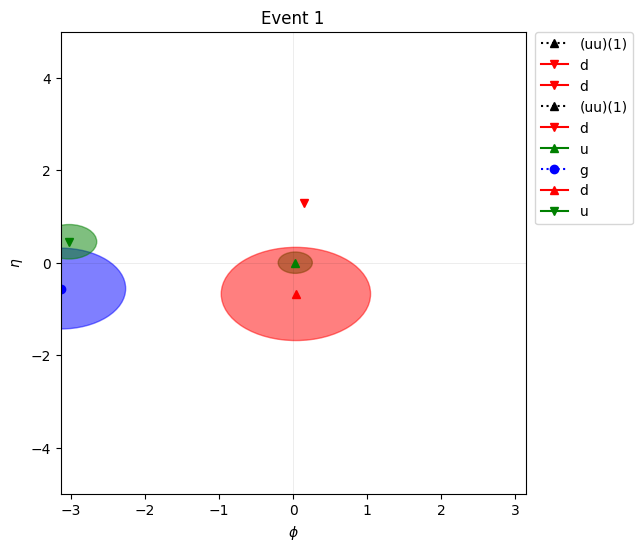

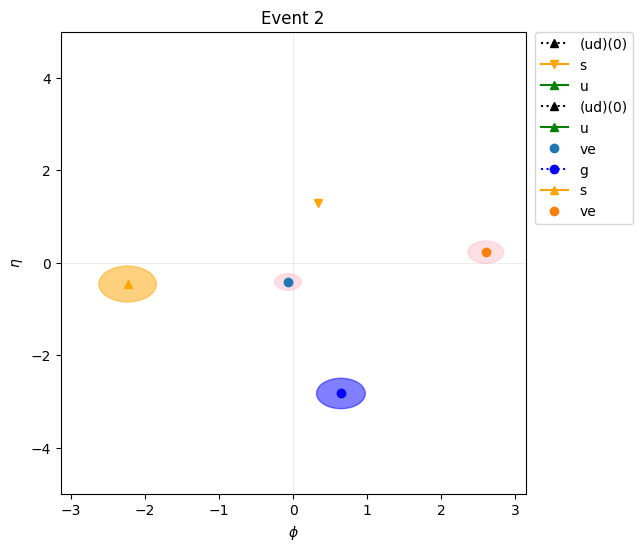

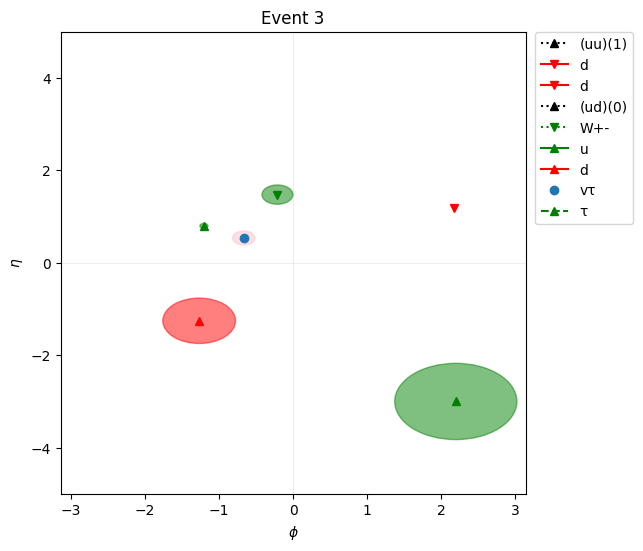

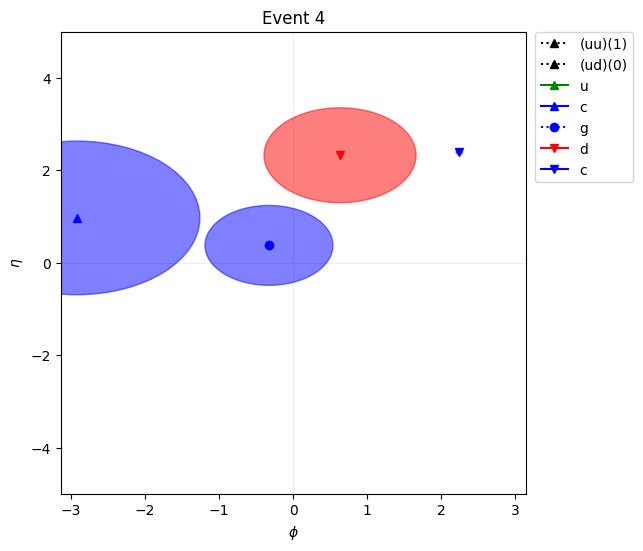

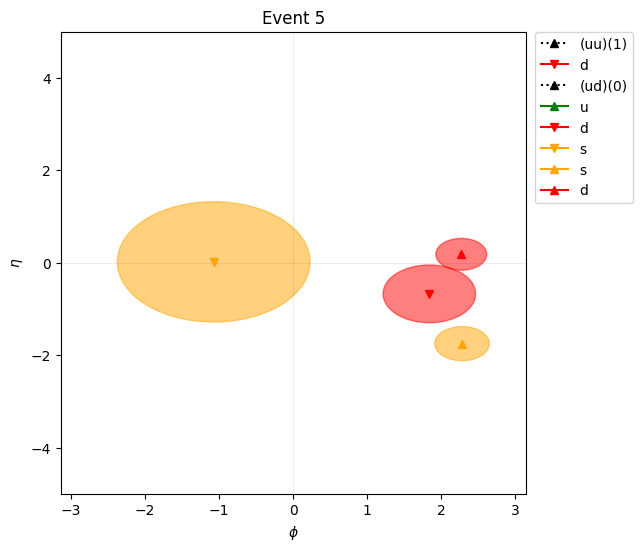

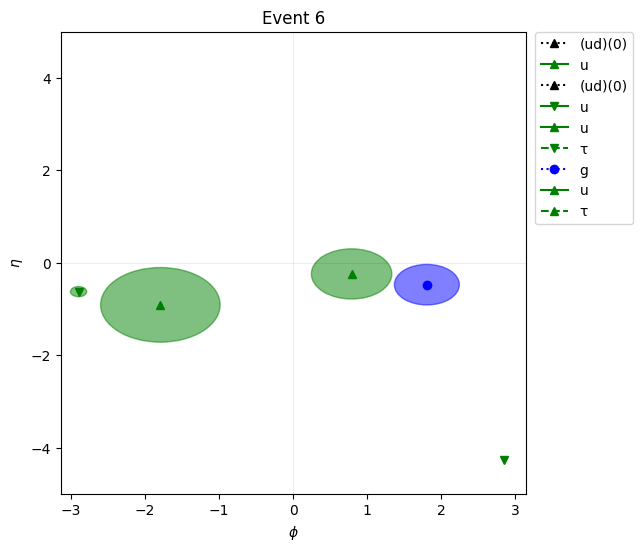

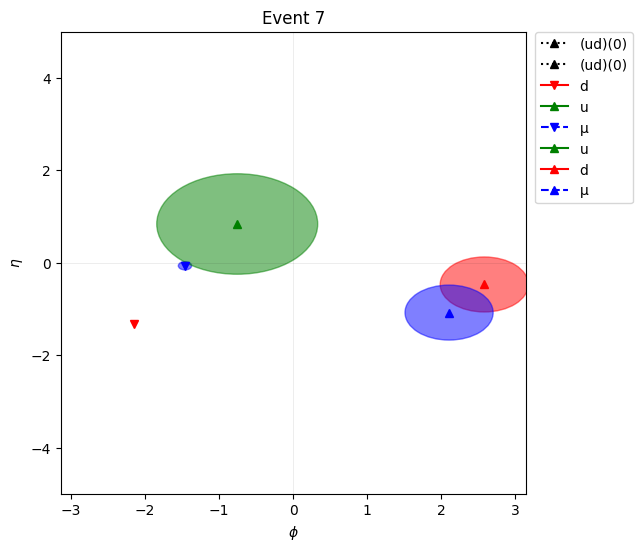

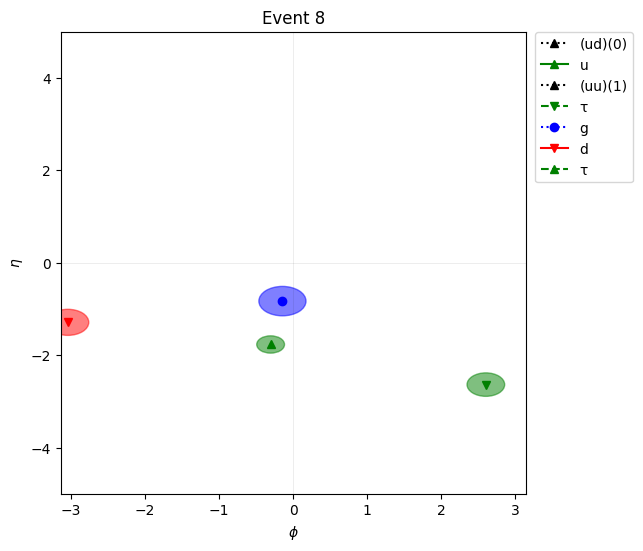

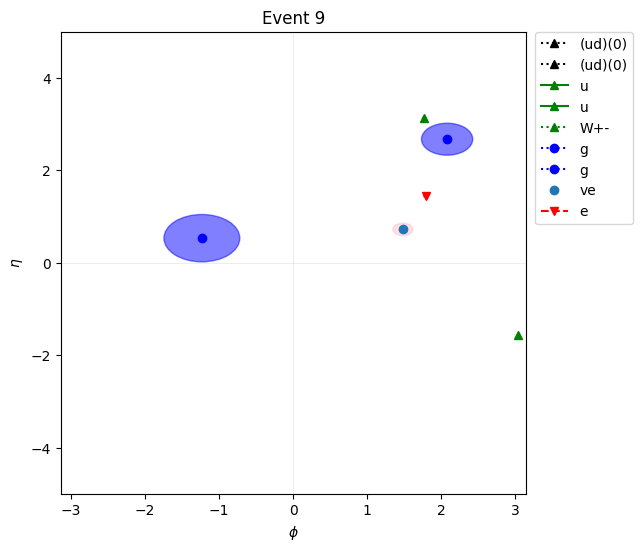

In [75]:
# plot etaphi, decayed 
with pyhepmc.open('data/events_decayed.hepmc.gz') as f:
    for i,event in enumerate(f):
        fs = GetFS(event)
        fig,ax=get_figure_etaphi(fs)
        draw_etaphi(ax, fs)
        ax.set_title(f'Event {i}')
        plt.show()

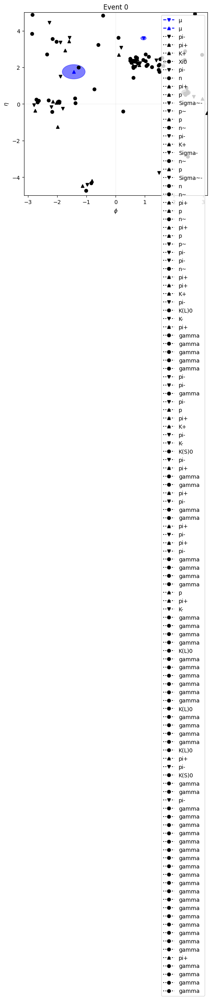

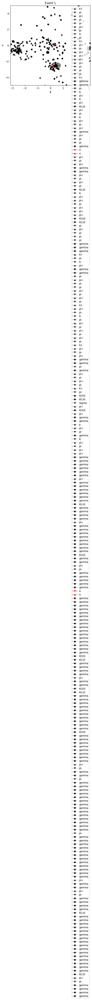

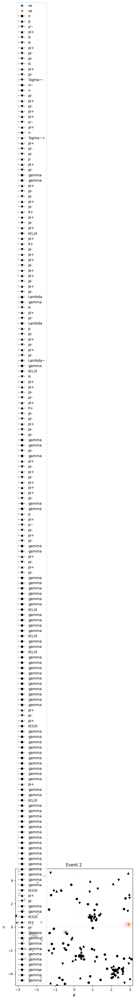

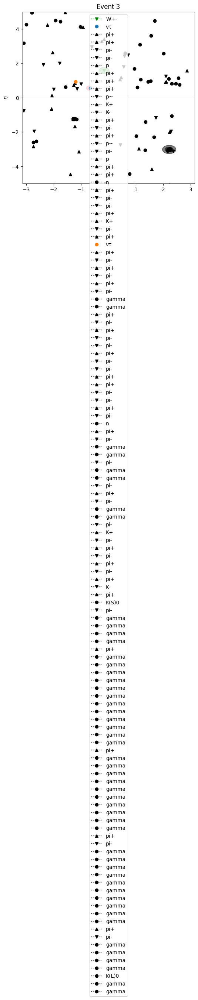

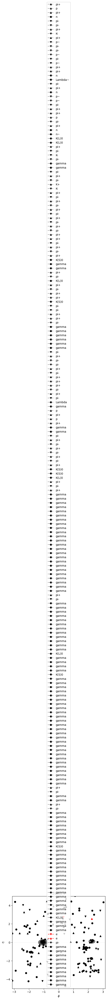

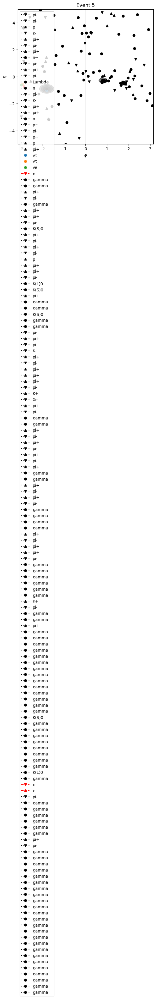

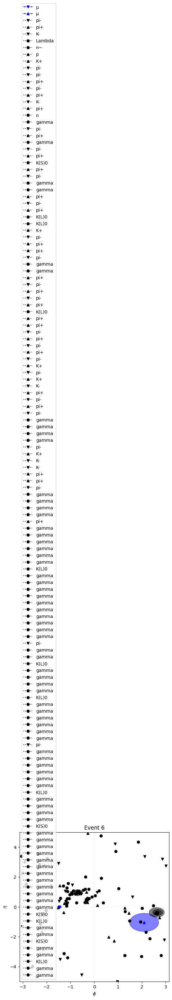

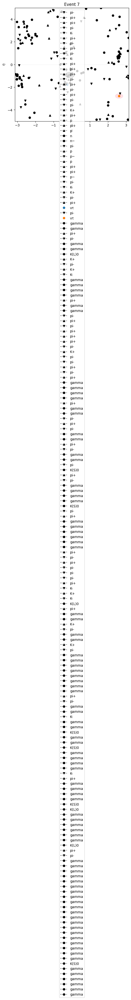

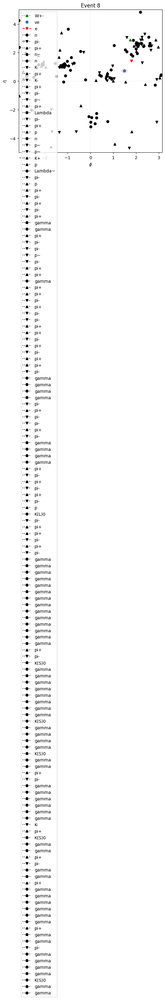

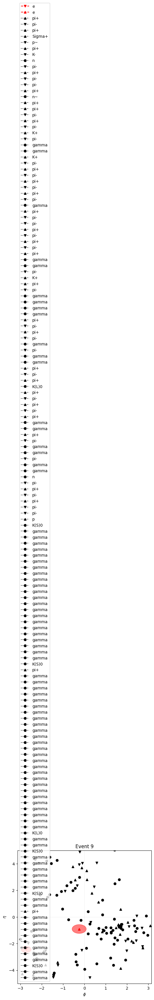

In [102]:
# plot etaphi, hadronised
with pyhepmc.open('data/events_decayed_hadronised.hepmc.gz') as f:
    for i,event in enumerate(f):
        fs = GetFS(event)
        fig,ax=get_figure_etaphi(fs)
        draw_etaphi(ax, fs, showlegend=True)
        ax.set_title(f'Event {i}')
        plt.show()

In [94]:
# main longitudinal
def get_figure_longitudinal(particles):
    pzs=1.1*max([abs(p.momentum.pz) for p in particles]) 
    pts=1.1*max([abs(p.momentum.pt()) for p in particles])    
    pztmax=max(pzs,pts)
    fig, ax = plt.subplots(figsize=(6,6))
    ax.axis('equal')
    ax.axis([-pztmax, pztmax, -pztmax, pztmax])
    ax.axhline(y=0, xmin=-pzs, xmax=pzs, color='black',alpha=0.1, linewidth=0.5)
    ax.axvline(x=0, ymin=-pts, ymax=pts, color='black', alpha=0.1, linewidth=0.5)
    ax.set_xlabel('$p_{z}$ (GeV)')
    ax.set_ylabel('$p_{t}$ (GeV)')
    return fig,ax    

def draw_longitudinal(ax, particles, showlegend=True):
    for p in particles:
        ax.plot([0,p.momentum.pz], [0,p.momentum.pt()], **line_args(p), **line_label(p), markersize=5)
        plt.legend(bbox_to_anchor=(1.02,1), loc='upper left', borderaxespad=0)
        if showlegend: ax.legend()

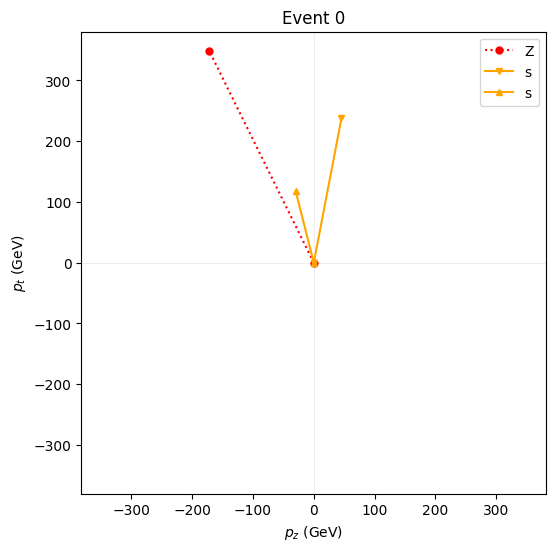

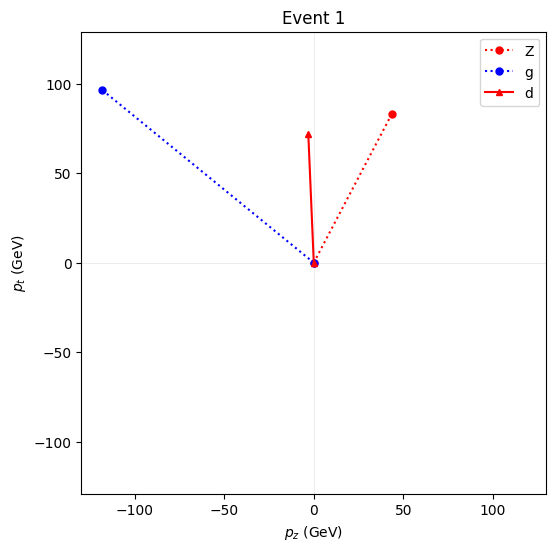

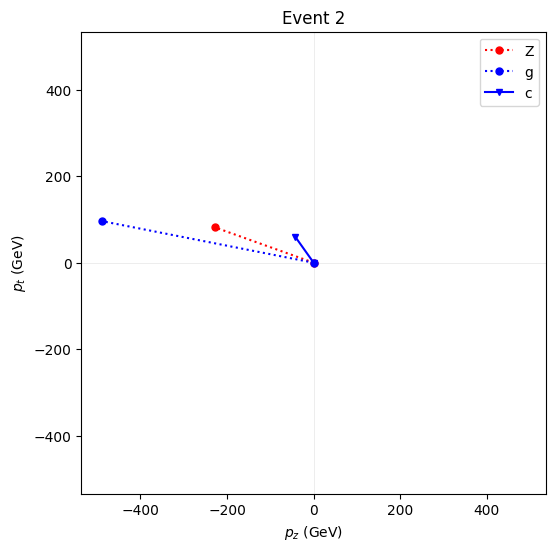

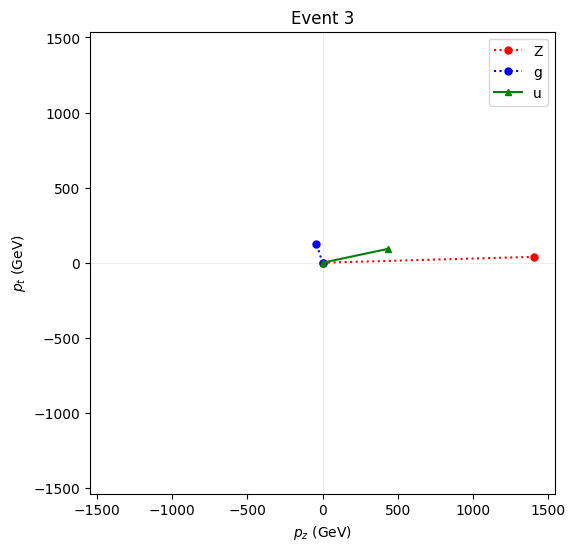

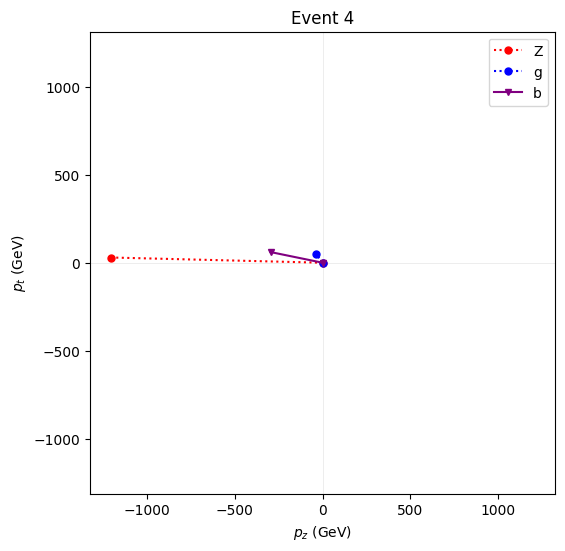

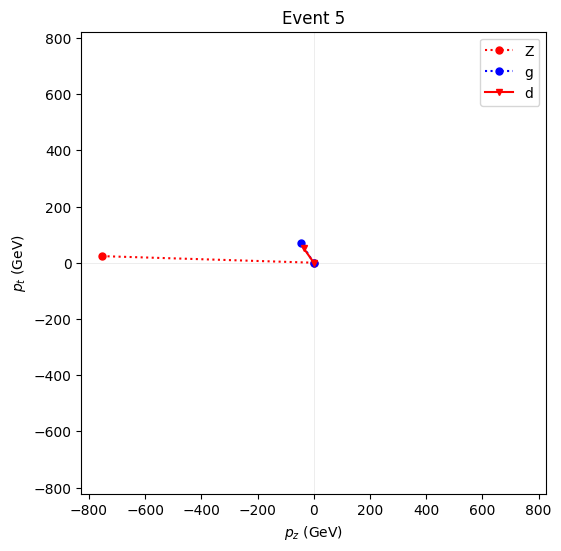

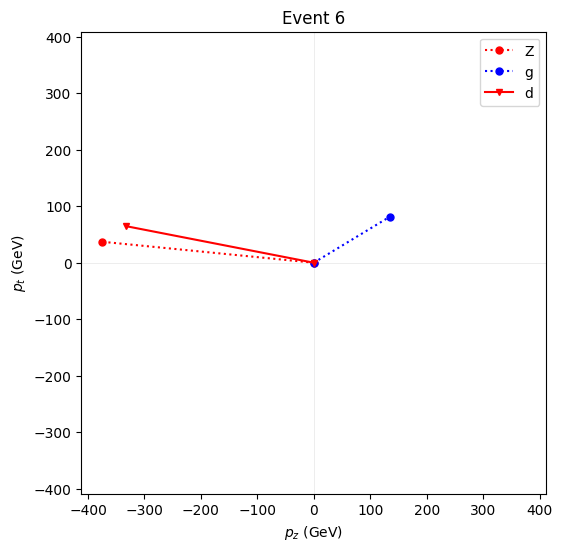

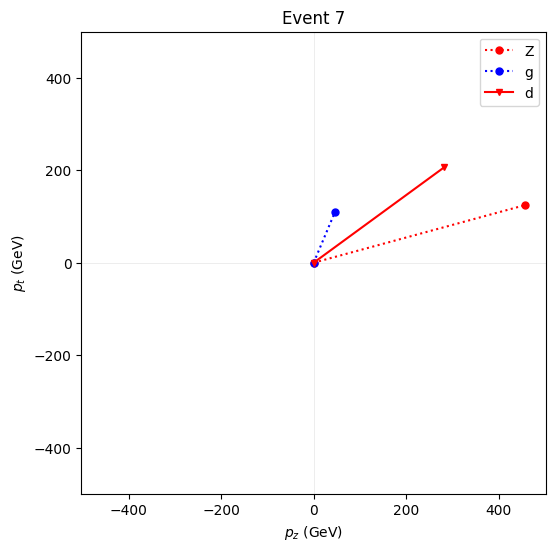

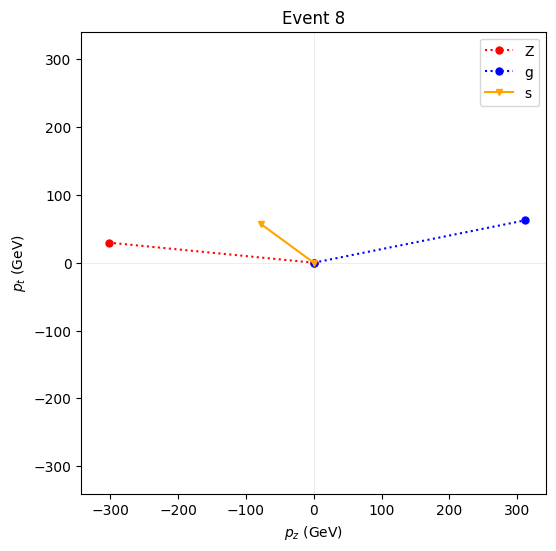

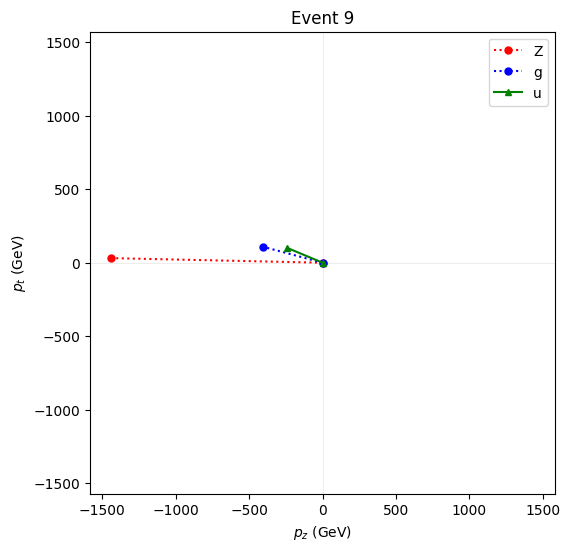

In [95]:
# plot longitudinal, hard
with pyhepmc.open('data/events.hepmc.gz') as f:
    for i,event in enumerate(f):
        fs = GetFS(event)
        fig,ax=get_figure_longitudinal(fs)
        draw_longitudinal(ax, fs)
        ax.set_title(f'Event {i}')
        plt.show()

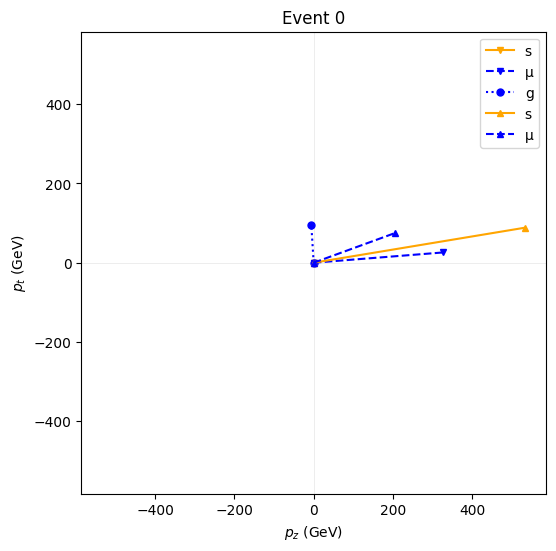

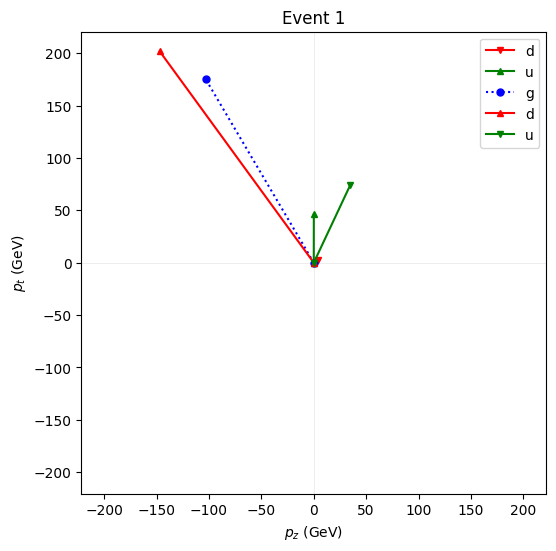

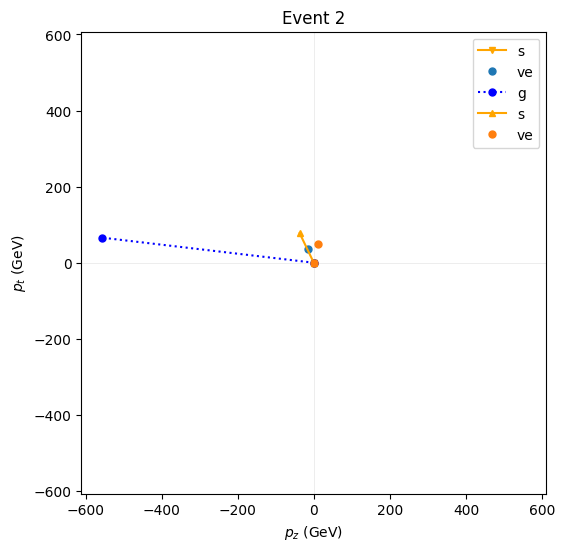

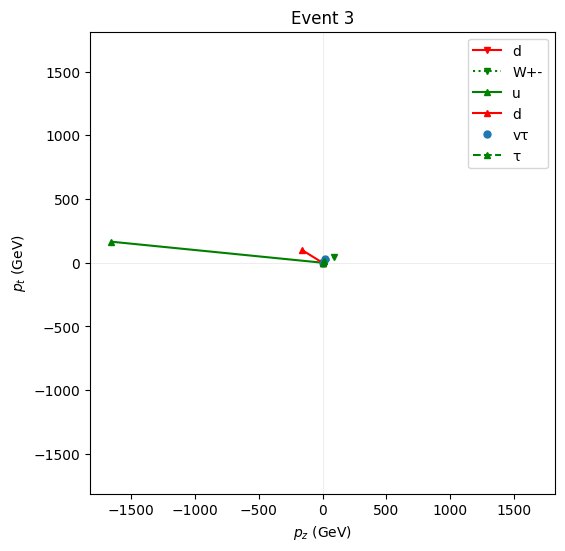

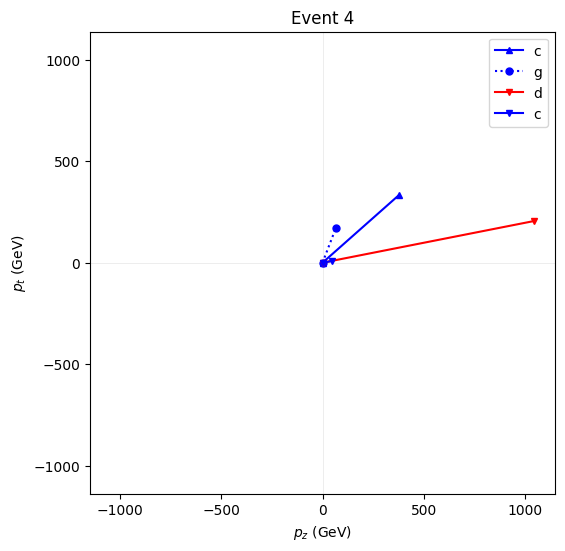

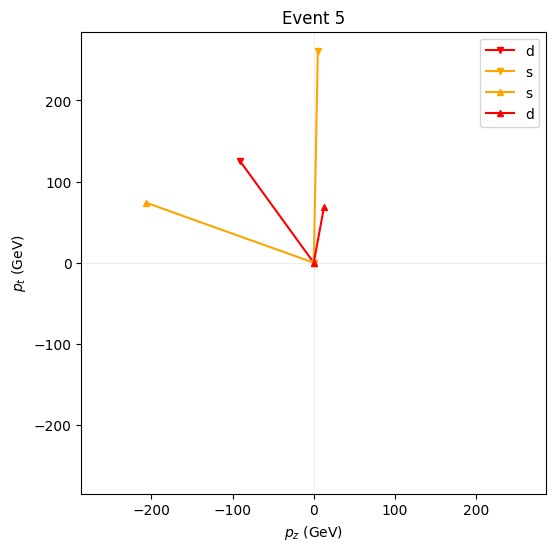

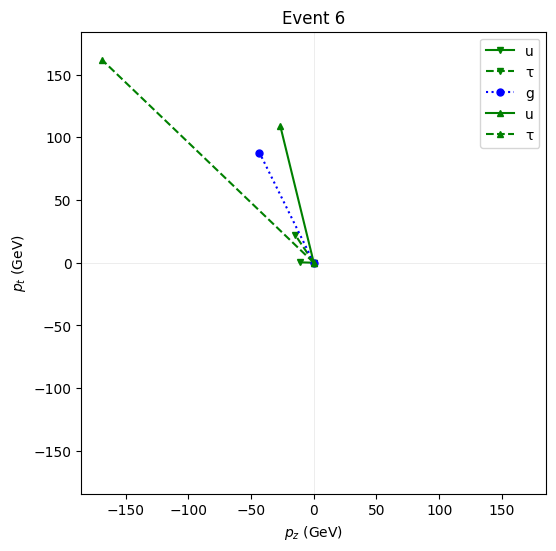

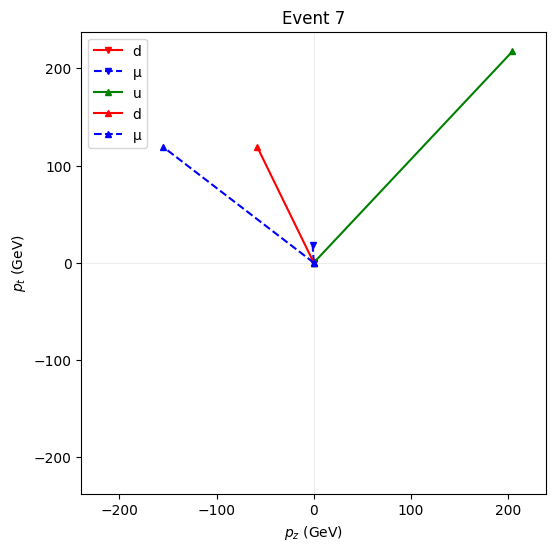

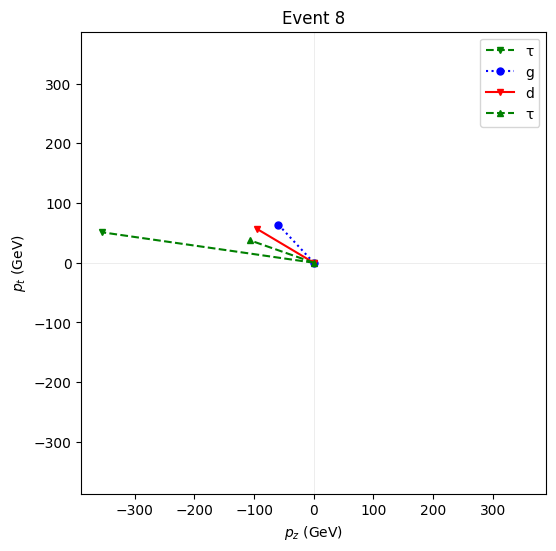

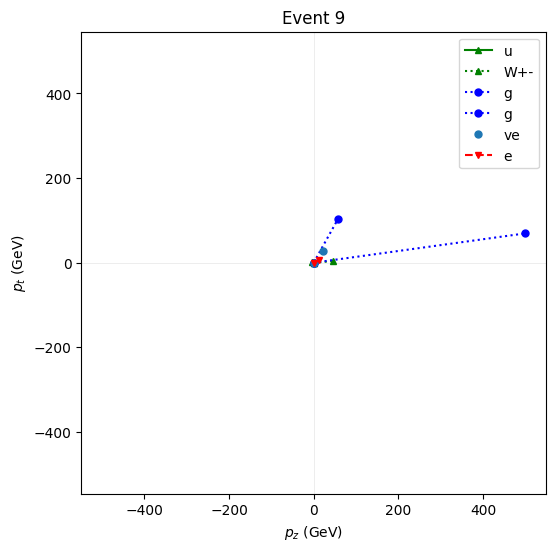

In [99]:
# plot longitudinal, decayed
with pyhepmc.open('data/events_decayed.hepmc.gz') as f:
    for i,event in enumerate(f):
        fs = [f for f in GetFS(event) if abs(f.momentum.eta())<5]
        fig,ax=get_figure_longitudinal(fs)
        draw_longitudinal(ax, fs)
        ax.set_title(f'Event {i}')
        plt.show()

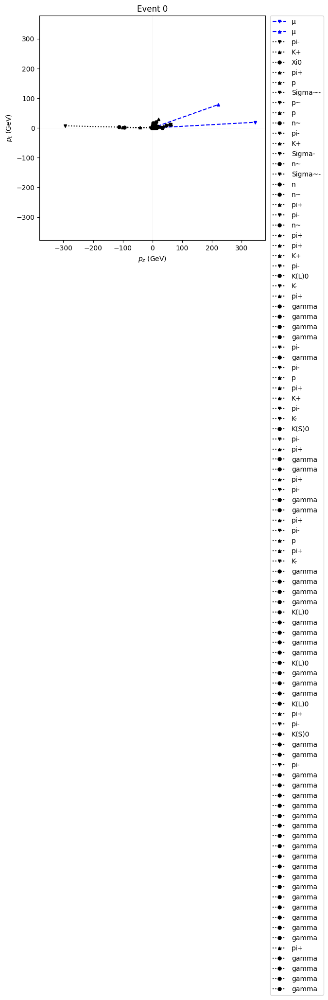

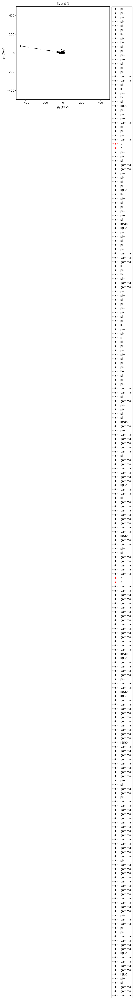

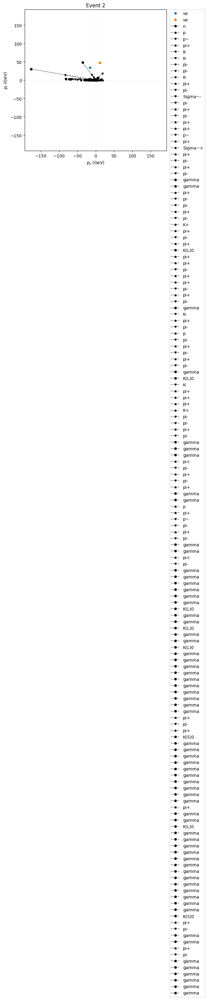

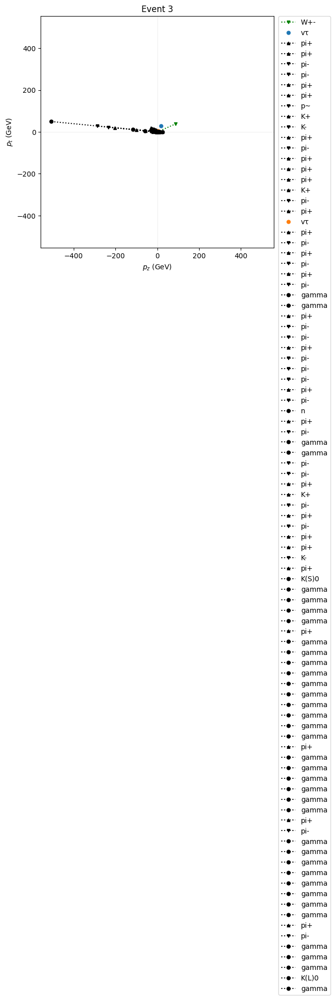

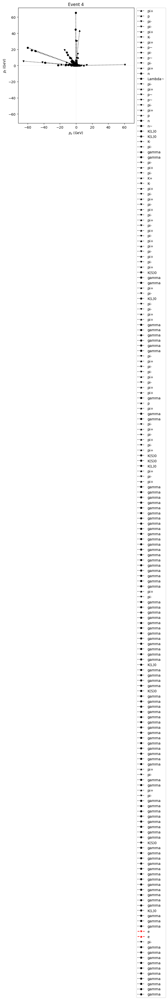

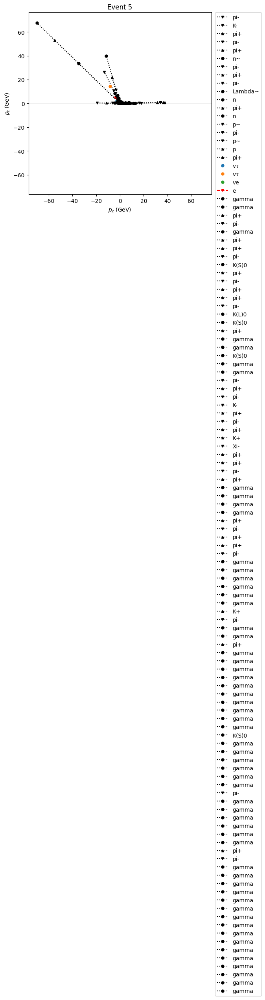

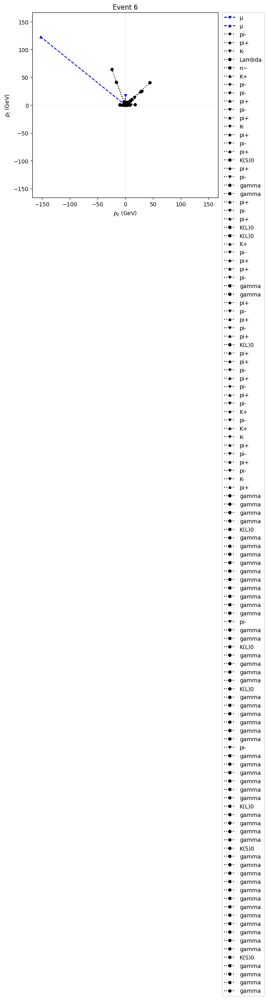

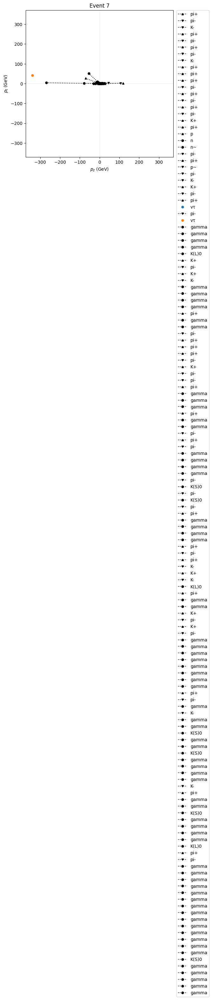

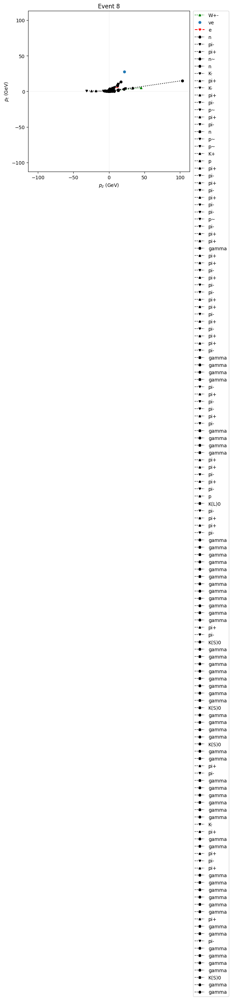

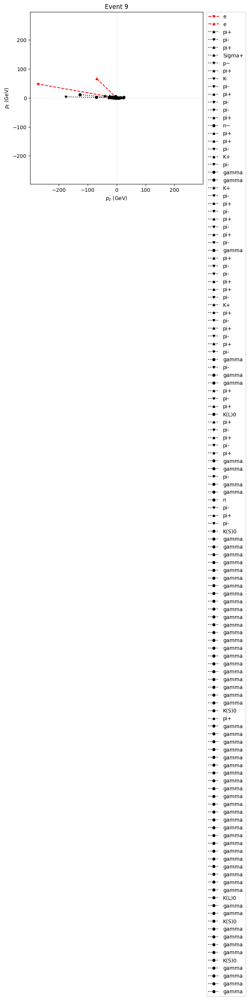

In [97]:
# plot longitudinal, hadronised
with pyhepmc.open('data/events_decayed_hadronised.hepmc.gz') as f:
    for i,event in enumerate(f):
        fs = [f for f in GetFS(event) if abs(f.momentum.eta())<5]
        fig,ax=get_figure_longitudinal(fs)
        draw_longitudinal(ax, fs, showlegend=False)
        ax.set_title(f'Event {i}')
        plt.show()